**<h1> Manipulating Images </h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, both as arrays and PIL image objects. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab:


In [7]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


'wget' is not recognized as an internal or external command,
operable program or batch file.


We will be using these imported functions in the lab:


In [8]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. 


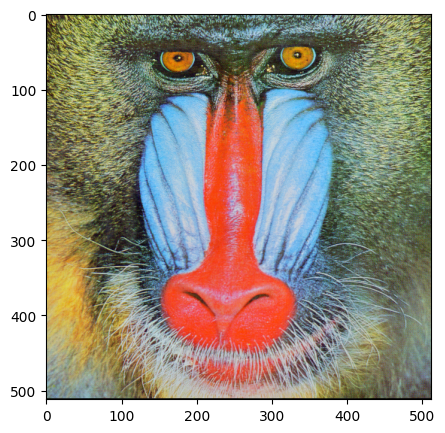

In [ ]:
baboon = np.array(Image.open('baboon.png'))
plt.figure(figsize=(5,5)) # Tạo một cửa sổ/vùng vẽ đồ thị mới (figure) với kích thước chiều rộng và chiều cao cố định là 5x5 inch.
plt.imshow(baboon )
plt.show()

If we do not apply the method `copy()`, the two variables would point to the same location in memory:


In [10]:
A = baboon

We use the  `id`  function to find a variable's memory address; we see the objects in the memory space which the variables `A` and `baboon` point to are the same.


In [ ]:
id(A) == id(baboon)  # Kiểm tra xem biến 'A' và biến 'baboon' có trỏ tới cùng một đối tượng duy nhất trong bộ nhớ hay không.

True

However, if we apply method `copy()`, their memory addresses are different.


In [ ]:
B = baboon.copy() # Tạo một BẢN SAO độc lập hoàn toàn của mảng NumPy 'baboon' và gán cho biến 'B'.
id(B)==id(baboon)# Kiểm tra xem 'B' và 'baboon' có cùng trỏ đến MỘT đối tượng trong bộ nhớ hay không.


False

There may be unexpected behaviours when two variables point to the same object in memory. Consider the array `baboon`. If we set all its entries to zero, all entires in `A` will become zero as well. However, as `baboon` and `B` points to different objects, the values in `B` will not be affected. 


In [ ]:
baboon[:,:,] = 0# Gán giá trị 0 cho TẤT CẢ các phần tử (pixel) trong mảng 'baboon'.
# Thao tác này biến toàn bộ hình ảnh thành màu đen.

We can compare the variables <code>baboon</code> and array <code>A</code>:


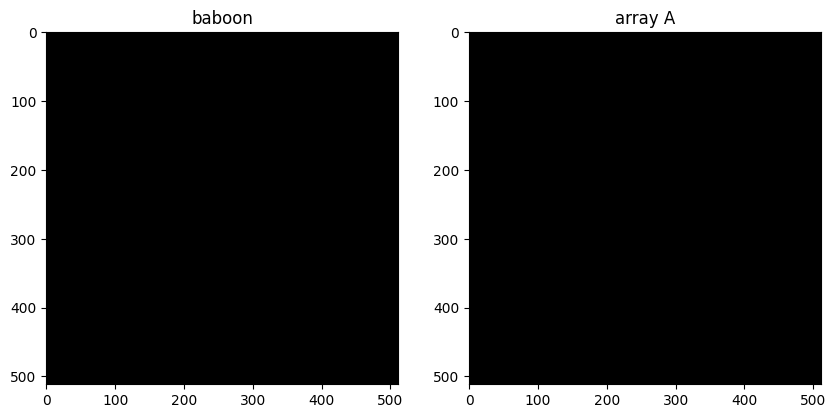

In [ ]:
plt.figure(figsize=(10,10)) # Tạo một vùng vẽ lớn (figure) có kích thước 10x10 inch để chứa 2 biểu đồ con.

plt.subplot(121)            # Tạo một ô biểu đồ con: lưới 1 hàng, 2 cột, và chọn vị trí thứ 1 (bên trái).
plt.imshow(baboon)          # Hiển thị nội dung của mảng 'baboon' (lúc này đã bị đổi thành màu đen) vào ô thứ nhất.
plt.title("baboon")         # Đặt tiêu đề cho ô biểu đồ con thứ nhất là "baboon".

plt.subplot(122)            # Tạo một ô biểu đồ con: lưới 1 hàng, 2 cột, và chọn vị trí thứ 2 (bên phải).
plt.imshow(A)               # Hiển thị nội dung của mảng 'A' vào ô thứ hai.
plt.title("array A")        # Đặt tiêu đề cho ô biểu đồ con thứ hai là "array A".

plt.show()             


We see they are the same. This behaviour is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable. Variables are references to values on the memory. 

We can also compare <code>baboon</code> and array <code>B</code>:


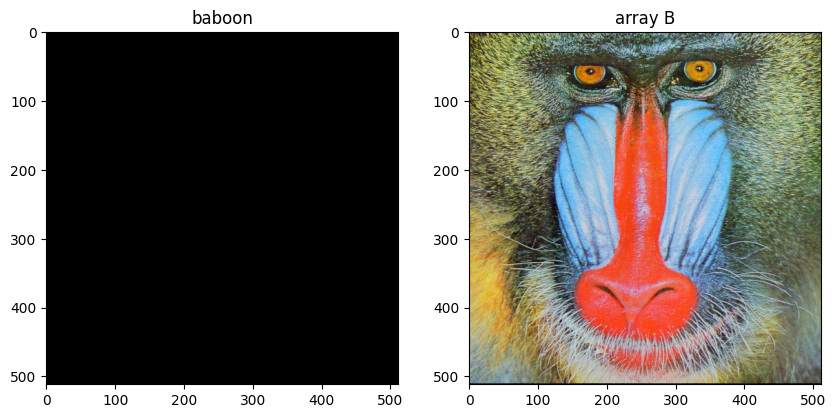

In [ ]:
plt.figure(figsize=(10,10)) # Tạo một vùng vẽ lớn (figure) có kích thước 10x10 inch để chứa 2 biểu đồ con.

plt.subplot(121)            # Tạo một ô biểu đồ con: lưới 1 hàng, 2 cột, và chọn vị trí thứ 1 (bên trái).
plt.imshow(baboon)          # Hiển thị nội dung của mảng 'baboon' (đã bị đổi thành màu đen) vào ô thứ nhất.
plt.title("baboon")         # Đặt tiêu đề cho ô biểu đồ con thứ nhất là "baboon".

plt.subplot(122)            # Tạo một ô biểu đồ con: lưới 1 hàng, 2 cột, và chọn vị trí thứ 2 (bên phải).
plt.imshow(B)               # Hiển thị nội dung của mảng 'B' vào ô thứ hai.
plt.title("array B")        # Đặt tiêu đề cho ô biểu đồ con thứ hai là "array B".

plt.show()                



If a PIL function does not return a new image, the same principle applies. We will go over some examples later on. 


## Flipping Images 


Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:


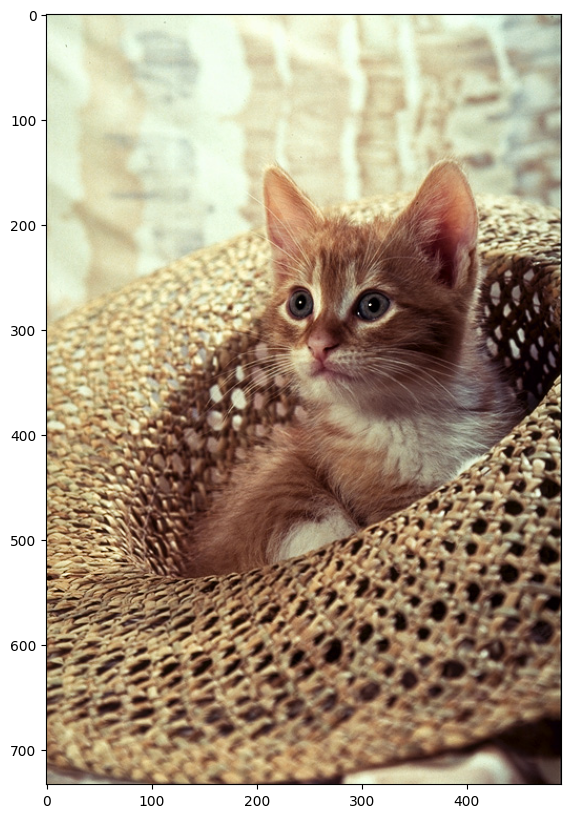

In [ ]:
image = Image.open("cat.png") # Mở tệp hình ảnh 'cat.png' bằng thư viện Pillow (PIL.Image), và lưu đối tượng ảnh vào biến 'image'.

plt.figure(figsize=(10,10))  # Tạo một vùng vẽ (figure) trong Matplotlib có kích thước 10x10 inch.

plt.imshow(image)            # Hiển thị đối tượng hình ảnh đã mở (biến 'image') lên vùng vẽ đó.

plt.show()                 


We can cast it to an array and find its shape:


In [ ]:
array = np.array(image)                      # Chuyển đổi đối tượng hình ảnh (biến 'image') thành một mảng NumPy nhiều chiều và lưu vào biến 'array'.

width, height, C = array.shape               # Lấy các kích thước (chiều rộng, chiều cao, số kênh màu) từ thuộc tính .shape của mảng.

print('width, height, C', width, height, C)  # In ra màn hình dòng chữ 'width, height, C' cùng với các giá trị số tương ứng.


width, height, C 733 490 3


Let's flip, i.e rotate vertically, the image. Let's try the traditional approach. First, we create an array of the same size with datatype <code>np.uint8</code>.


In [ ]:
array_flip = np.zeros((width, height, C), dtype=np.uint8) 
# Tạo một mảng NumPy mới có tên 'array_flip' với các đặc điểm sau:
# 1. Kích thước giống hệt ảnh gốc: (chiều rộng x chiều cao x số kênh màu).
# 2. Điền đầy tất cả các giá trị bằng SỐ KHÔNG (màu đen).
# 3. Kiểu dữ liệu là 'np.uint8' (số nguyên không dấu 8-bit), đây là kiểu dữ liệu chuẩn để lưu trữ giá trị pixel (từ 0 đến 255).


We assign the first row of pixels of the original array to the new array’s last row. We repeat the process for every row, incrementing the row number from the original array and decreasing the new array’s row index to assign the pixels accordingly. After excecuting the for loop below, `array_flip` will become the flipped image. 


In [ ]:
for i,row in enumerate(array):
    # Bắt đầu một vòng lặp duyệt qua từng hàng trong mảng 'array' (ảnh gốc).
    # 'i' là chỉ mục (index) của hàng hiện tại, bắt đầu từ 0.
    # 'row' là dữ liệu của hàng ảnh hiện tại.

    array_flip[width - 1 - i, :, :] = row 
    # Gán hàng dữ liệu 'row' đó vào vị trí tương ứng trong mảng mới 'array_flip', 
    # NHƯNG với chỉ mục được đảo ngược:
    # 'width - 1 - i' tính toán vị trí hàng ngược lại (ví dụ: hàng 0 của ảnh gốc 
    # được gán vào hàng cuối cùng của ảnh lật; hàng 1 được gán vào hàng áp cuối, v.v.).
    # ':, :' đảm bảo toàn bộ dữ liệu chiều rộng và các kênh màu của hàng đó được sao chép.


<code>PIL</code> has several ways to flip an image, for example, we can use the <code>ImageOps</code> module:


In [51]:
from PIL import ImageOps 
# Nhập mô-đun 'ImageOps' từ thư viện PIL (Pillow - dùng để xử lý ảnh).
# Mô-đun này cung cấp các thao tác xử lý hình ảnh bổ sung như lật, xoay, cân bằng màu sắc, áp dụng bộ lọc đường viền, v.v.


The `flip()` method of `ImageOps` module flips the image. The `mirror()` method will mirror  the image:


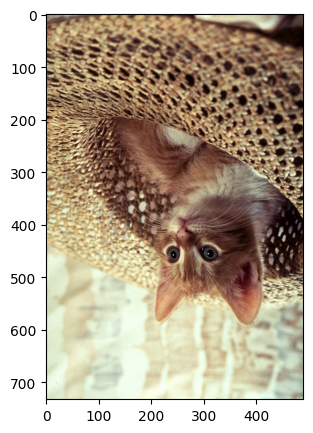

In [ ]:
im_flip = ImageOps.flip(image) # Sử dụng hàm 'flip' từ ImageOps để lật đối tượng 'image' (ảnh con mèo) theo chiều dọc (trên xuống dưới). Kết quả được lưu vào biến 'im_flip'.

plt.figure(figsize=(5,5))      # Tạo một vùng vẽ (figure) mới trong Matplotlib với kích thước 5x5 inch.

plt.imshow(im_flip)            # Hiển thị hình ảnh đã lật ('im_flip') lên vùng vẽ đó.

plt.show()                 


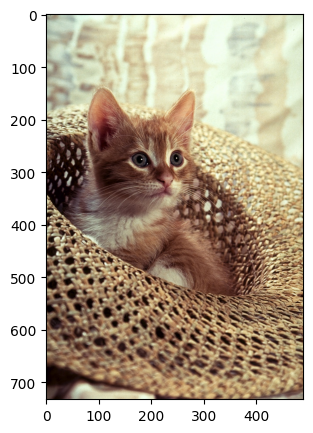

In [ ]:
im_mirror = ImageOps.mirror(image) # Sử dụng hàm 'mirror' từ ImageOps để lật đối tượng 'image' (ảnh con mèo) theo chiều ngang (trái sang phải). Kết quả được lưu vào biến 'im_mirror'.

plt.figure(figsize=(5,5))          # Tạo một vùng vẽ (figure) mới trong Matplotlib với kích thước 5x5 inch.

plt.imshow(im_mirror)              # Hiển thị hình ảnh đã lật gương ('im_mirror') lên vùng vẽ đó.

plt.show()                        


We can use  the <code>transpose()</code> method; the parameter is an integer indicating what type of transposition we would like to perform. For example, we can flip the image using a value of `1`.


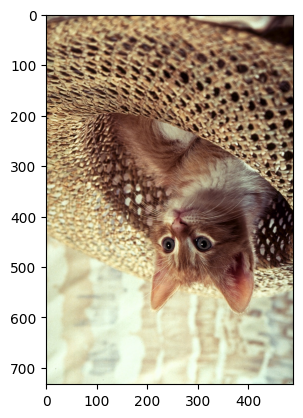

In [23]:
im_flip = image.transpose(1)
plt.imshow(im_flip)
plt.show()

The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following <code>dict</code>:


In [ ]:
flip = {
    "FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT, # Hằng số đại diện cho phép lật ảnh theo chiều ngang (tạo ảnh phản chiếu/gương).
    "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM, # Hằng số đại diện cho phép lật ảnh theo chiều dọc (lật ngược từ trên xuống dưới).
    "ROTATE_90": Image.ROTATE_90,             # Hằng số đại diện cho phép xoay ảnh 90 độ theo chiều kim đồng hồ.
    "ROTATE_180": Image.ROTATE_180,           # Hằng số đại diện cho phép xoay ảnh 180 độ.
    "ROTATE_270": Image.ROTATE_270,           # Hằng số đại diện cho phép xoay ảnh 270 độ theo chiều kim đồng hồ (hoặc 90 độ ngược chiều kim đồng hồ).
    "TRANSPOSE": Image.TRANSPOSE,             # Hằng số đại diện cho phép chuyển vị (transpose - lật dọc sau đó hoán đổi trục x và y).
    "TRANSVERSE": Image.TRANSVERSE            # Hằng số đại diện cho phép chuyển vị nghịch đảo (transverse - lật ngang sau đó hoán đổi trục x và y).
}


We see the values are integers.


In [25]:
flip["FLIP_LEFT_RIGHT"]

0

We can plot each of the outputs using the different  parameter values:


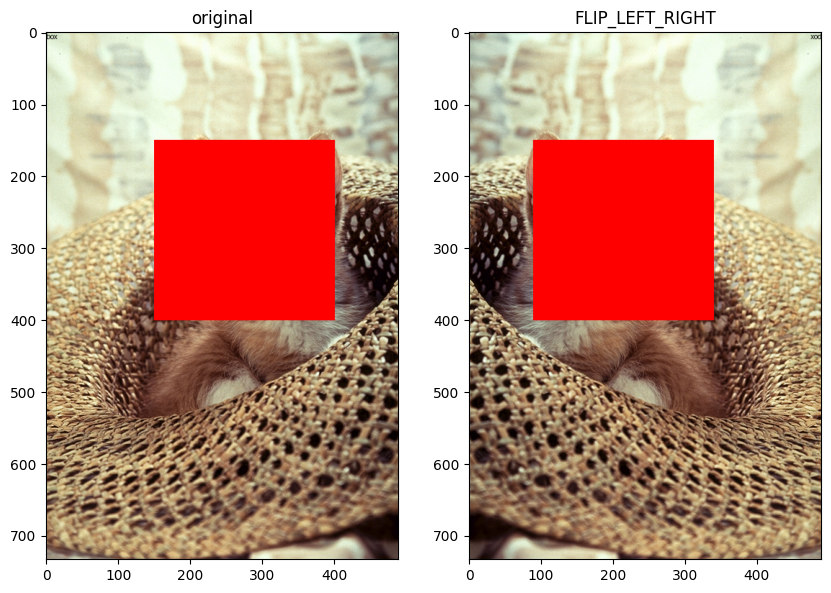

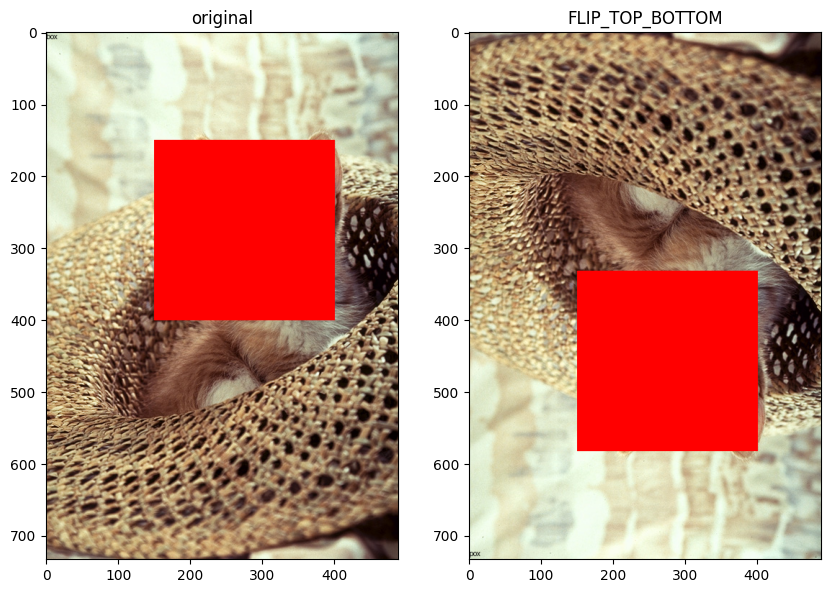

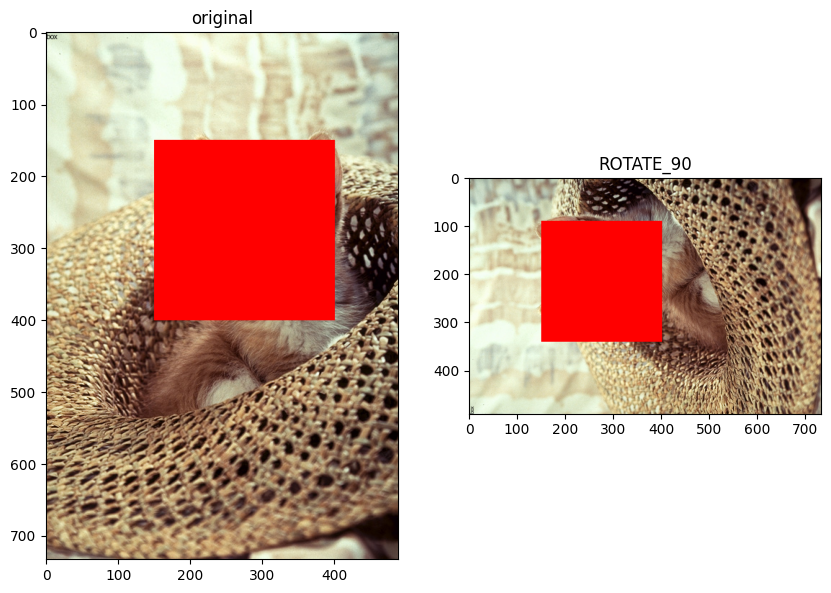

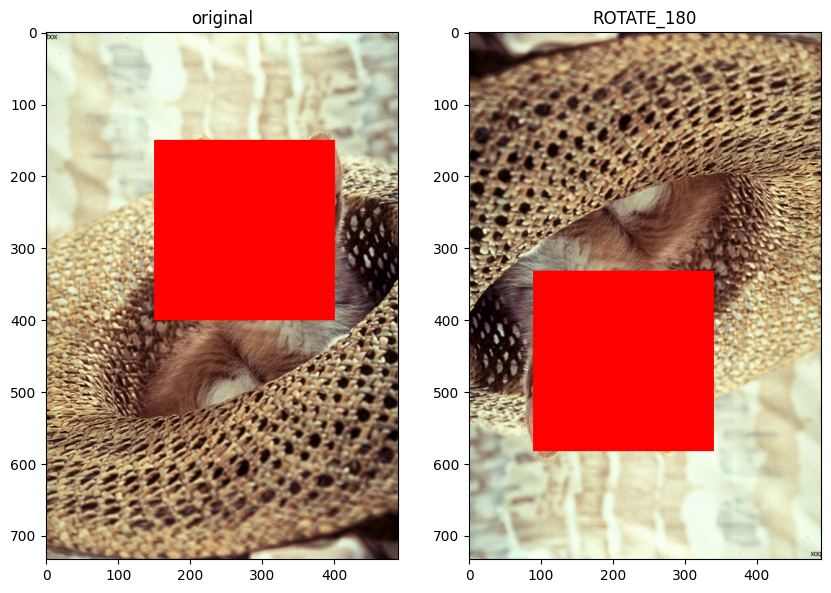

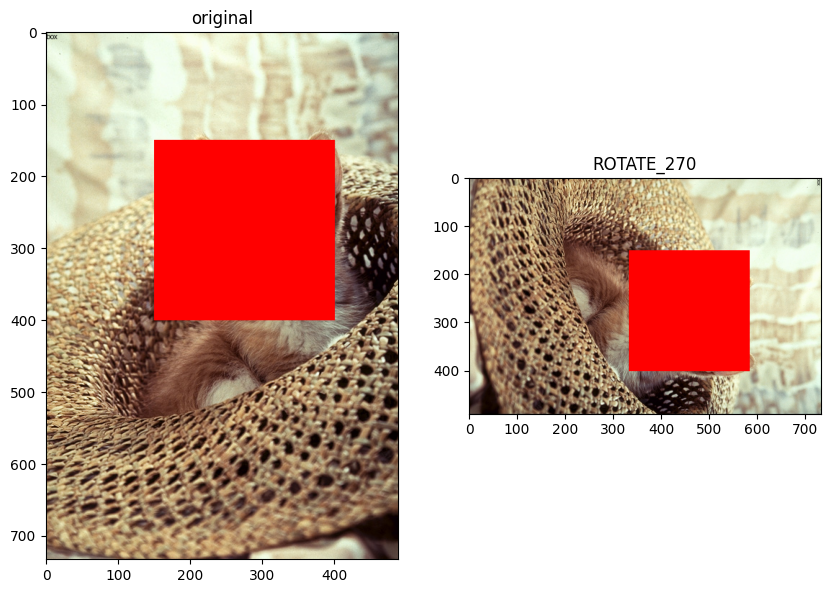

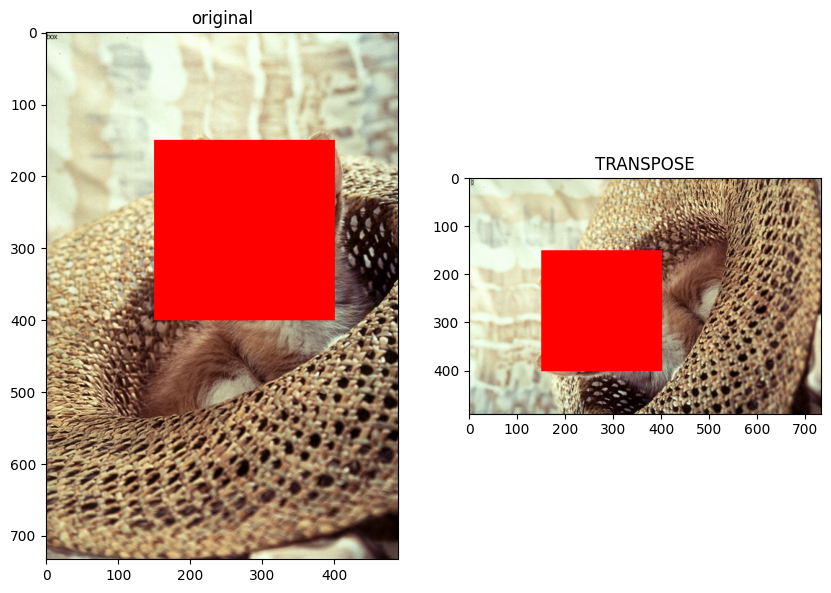

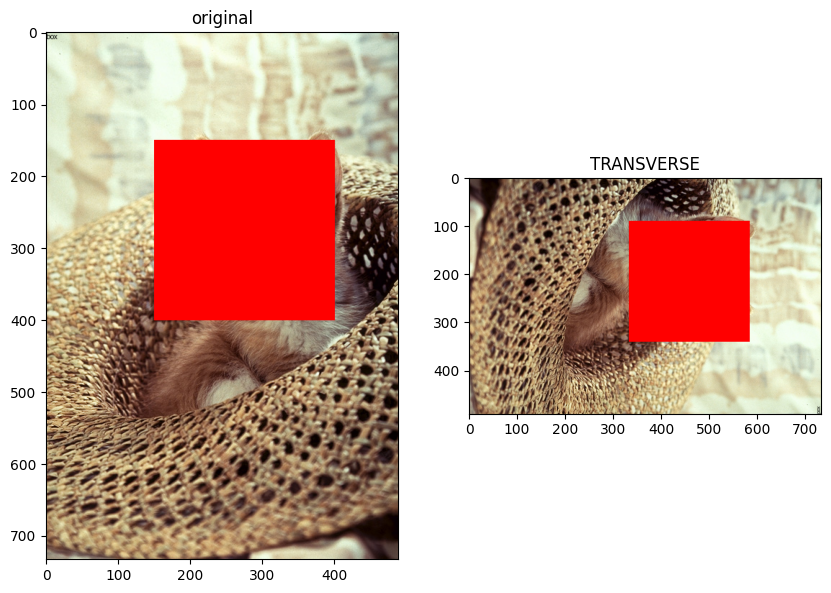

In [52]:
for key, values in flip.items():
    # Bắt đầu một vòng lặp duyệt qua TẤT CẢ các cặp khóa (key - tên phép biến đổi như "FLIP_TOP_BOTTOM") 
    # và giá trị (values - hằng số thực hiện phép biến đổi đó) trong từ điển 'flip'.

    plt.figure(figsize=(10,10))
    # Tạo một vùng vẽ lớn mới (figure) cho mỗi lần lặp, đảm bảo mỗi cặp ảnh có không gian riêng.

    plt.subplot(1,2,1)
    # Tạo ô biểu đồ con thứ nhất (trái) trong layout 1 hàng, 2 cột.

    plt.imshow(image)
    # Hiển thị ảnh gốc (biến 'image') vào ô bên trái.

    plt.title("original")
    # Đặt tiêu đề cho ô bên trái là "original".

    plt.subplot(1,2,2)
    # Tạo ô biểu đồ con thứ hai (phải) trong layout 1 hàng, 2 cột.

    plt.imshow(image.transpose(values))
    # Áp dụng phép biến đổi tương ứng với 'values' (ví dụ: Image.FLIP_TOP_BOTTOM) 
    # lên ảnh gốc và hiển thị kết quả vào ô bên phải.

    plt.title(key)
    # Đặt tiêu đề cho ô bên phải chính là 'key' (tên phép biến đổi, ví dụ: "FLIP_TOP_BOTTOM").

    plt.show()
    # Hiển thị cặp hình ảnh (gốc và đã biến đổi) ra màn hình trước khi chuyển sang vòng lặp tiếp theo.


 ## Cropping an Image


Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing. 

Let start with a vertical crop: the variable `upper` is the index of the first row that we would like to include in the image, the variable `lower` is the index of the last row we would like to include. We then perform array slicing to obtain the new image. 


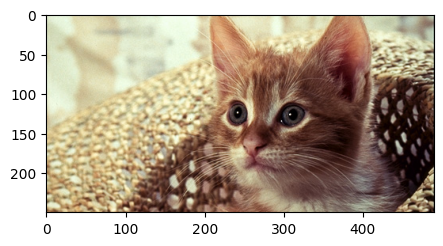

In [ ]:
upper = 150                                  # Định nghĩa chỉ số hàng bắt đầu cắt (mức trên, ví dụ: 150 pixel từ đỉnh ảnh xuống).
lower = 400                                  # Định nghĩa chỉ số hàng kết thúc cắt (mức dưới, ví dụ: 400 pixel từ đỉnh ảnh xuống).

crop_top = array[upper: lower,:,:]           # Cắt lát mảng 'array' (ảnh con mèo gốc):
# [upper: lower, ...] chọn tất cả các hàng từ chỉ số 150 đến 399.
# [:, :] giữ nguyên tất cả các cột (chiều rộng) và tất cả các kênh màu.
# Kết quả là một mảng NumPy mới chứa dải pixel đã chọn, lưu vào 'crop_top'.

plt.figure(figsize=(5,5))                    # Tạo một vùng vẽ (figure) mới trong Matplotlib có kích thước 5x5 inch.

plt.imshow(crop_top)                         # Hiển thị phần hình ảnh đã cắt ('crop_top') lên vùng vẽ đó.

plt.show()                                   # Hiển thị cửa sổ chứa phần ảnh đã cắt ra màn hình.


Consider the array `crop_top`: we can also crop horizontally. The variable `right` is the index of the first column that we would like to include in the image and the variable `left` is the index of the last column we would like to include in the image.


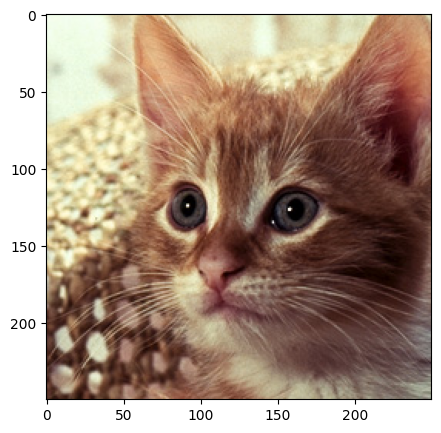

In [ ]:
left = 150                                   # Định nghĩa chỉ số cột bắt đầu cắt (mức bên trái, ví dụ: 150 pixel từ lề trái).
right = 400                                  # Định nghĩa chỉ số cột kết thúc cắt (mức bên phải, ví dụ: 400 pixel từ lề trái).

crop_horizontal = crop_top[: ,left:right,:]  # Cắt lát mảng 'crop_top' (phần ảnh đã cắt dọc trước đó):
                                             # [:, ...] giữ nguyên tất cả các hàng (chiều cao) của 'crop_top'.
                                             # [, left:right, :] chọn tất cả các cột từ chỉ số 150 đến 399.
                                             # [:, :, :] giữ nguyên tất cả các kênh màu.
                                             # Kết quả là một mảng NumPy mới chứa dải pixel đã chọn, lưu vào 'crop_horizontal'.

plt.figure(figsize=(5,5))                    # Tạo một vùng vẽ (figure) mới trong Matplotlib có kích thước 5x5 inch.

plt.imshow(crop_horizontal)                  # Hiển thị phần hình ảnh đã cắt hoàn chỉnh ('crop_horizontal') lên vùng vẽ đó.

plt.show()                                   # Hiển thị cửa sổ chứa phần ảnh đã cắt ra màn hình.


You can crop the PIL image using the <code>crop()</code> method, using the parameters from above Set the cropping area with <code>box=(left, upper, right, lower)</code>.


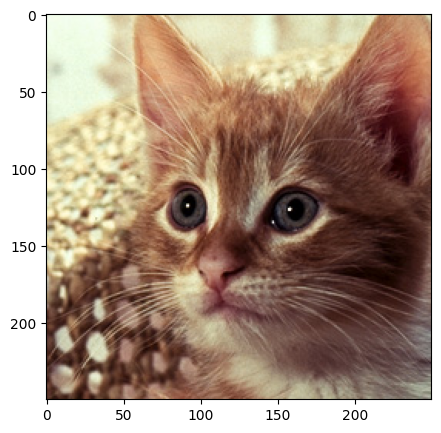

In [53]:
image = Image.open("cat.png") # Mở lại tệp hình ảnh 'cat.png' bằng PIL.Image, lưu vào biến 'image' (để đảm bảo ảnh gốc chưa bị cắt xén bởi các lệnh NumPy trước đó).

crop_image = image.crop((left, upper, right, lower)) 
# Sử dụng phương thức .crop() của đối tượng Image. 
# Phương thức này nhận một tuple 4 giá trị định nghĩa hộp giới hạn (bounding box) để cắt: 
# (tọa độ X trái, tọa độ Y trên, tọa độ X phải, tọa độ Y dưới).

plt.figure(figsize=(5,5))                     # Tạo một vùng vẽ (figure) mới trong Matplotlib có kích thước 5x5 inch.

plt.imshow(crop_image)                        # Hiển thị phần hình ảnh đã cắt ('crop_image') lên vùng vẽ đó.

plt.show()                                    # Hiển thị cửa sổ chứa phần ảnh đã cắt ra màn hình.


We can also flip the new image:


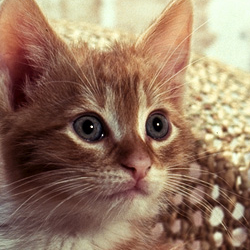

In [54]:
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT) 
# Áp dụng phép lật ảnh theo chiều ngang (trái sang phải) lên chính đối tượng 
# 'crop_image' đã cắt trước đó. Kết quả ghi đè lên biến 'crop_image'.

crop_image 
# Trong môi trường tương tác như Jupyter Notebook hoặc IPython, dòng lệnh này 
# sẽ gọi phương thức hiển thị mặc định của đối tượng Pillow Image, 
# tức là hiển thị ngay lập tức phần ảnh đã được cắt và lật đó ra màn hình 
# (không cần dùng plt.show()).


## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the green and blue channels in the original image we cropped to zero:


In [55]:
array_sq = np.copy(array) 
# Tạo một bản sao độc lập của mảng 'array' (ảnh gốc) và lưu vào 'array_sq' để tránh thay đổi dữ liệu gốc.

array_sq[upper:lower, left:right, 1:3] = 0 
# Tác động vào vùng ảnh xác định bởi (hàng từ upper đến lower, cột từ left đến right).
# Tại vùng này, gán giá trị 0 cho các kênh màu có chỉ số 1 và 2 (thường là Green và Blue trong hệ RGB).
# Kết quả là vùng này chỉ còn giữ lại kênh màu Đỏ (Red), khiến vùng bị cắt có tông màu đỏ rực.


We can compare the results with the new image. 


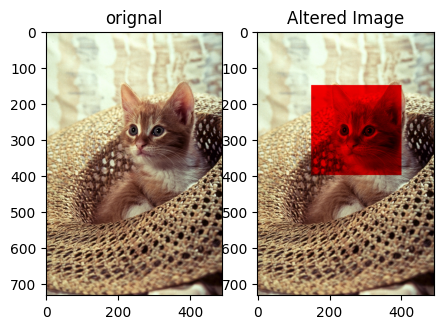

In [56]:
plt.figure(figsize=(5,5)) # Tạo một vùng vẽ lớn (figure) có kích thước 5x5 inch để chứa hai biểu đồ con.

plt.subplot(1,2,1)        # Tạo ô biểu đồ con thứ nhất (trái) trong layout 1 hàng, 2 cột.
plt.imshow(array)         # Hiển thị ảnh gốc (mảng 'array' của con mèo) vào ô bên trái.
plt.title("orignal")      # Đặt tiêu đề cho ô bên trái là "original".

plt.subplot(1,2,2)        # Tạo ô biểu đồ con thứ hai (phải) trong layout 1 hàng, 2 cột.
plt.imshow(array_sq)      # Hiển thị ảnh đã chỉnh sửa ('array_sq', ảnh con mèo với vùng đỏ) vào ô bên phải.
plt.title("Altered Image")# Đặt tiêu đề cho ô bên phải là "Altered Image".

plt.show()                # Hiển thị cửa sổ chứa hai hình ảnh song song ra màn hình.


We can also use the `ImageDraw` module from `PIL` library, which provides simple 2D graphics for Image objects 


In [ ]:
from PIL import ImageDraw 
# Nhập mô-đun 'ImageDraw' từ thư viện PIL (Pillow - dùng để xử lý ảnh).
# Mô-đun này cung cấp các công cụ cần thiết để vẽ các hình dạng hình học cơ bản (như đường thẳng, hình chữ nhật, hình tròn) 
# và văn bản trực tiếp lên một đối tượng hình ảnh (Image object).


We will copy the image object:


In [57]:
image_draw = image.copy() 
# Tạo một bản sao độc lập của đối tượng hình ảnh gốc (biến 'image', ảnh con mèo) 
# bằng phương thức .copy() của thư viện Pillow, và lưu bản sao này vào biến mới 'image_draw'.


The draw constructor creates an object that can be used to draw in the given image. The input <code>im</code> is the image we would like to draw in.



In [ ]:
image_fn = ImageDraw.Draw(im=image_draw)
# Tạo một đối tượng 'ImageDraw' mới tên là 'image_fn'.
# Đối tượng này liên kết với đối tượng hình ảnh 'image_draw' (bản sao ảnh con mèo).

Whatever method we apply to the object <code>image_fn</code>, will change the image object <code>image_draw</code>.


We can draw a rectangle using the <code>rectangle</code> function, two important parameters include: <code>xy</code> – the coordinates bounding box  and <code>fill</code> – Color of the rectangle.


In [ ]:
shape = [left, upper, right, lower] 
# Tạo một danh sách (list) chứa 4 tọa độ xác định vùng hình chữ nhật: 
# [x_trái, y_trên, x_phải, y_dưới].

image_fn.rectangle(xy=shape, fill="red")
# Sử dụng đối tượng vẽ 'image_fn' để vẽ một hình chữ nhật lên ảnh 'image_draw'.
# - xy=shape: Xác định vị trí và kích thước dựa trên danh sách tọa độ đã tạo.
# - fill="red": Tô đầy bên trong hình chữ nhật bằng màu đỏ.


We can plot the image.


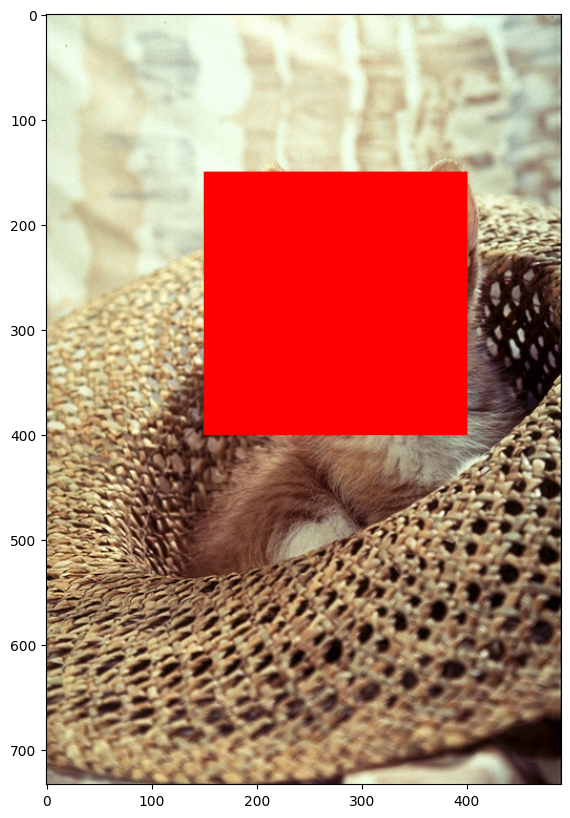

In [ ]:
plt.figure(figsize=(10,10))
# Tạo một vùng vẽ (figure) mới trong thư viện Matplotlib. 
# 'figsize=(10,10)' đặt kích thước của vùng vẽ này là 10 inch chiều rộng và 10 inch chiều cao. 
# Đây là bước chuẩn bị khung hình trước khi bạn vẽ bất kỳ biểu đồ hoặc hình ảnh nào lên đó.

plt.imshow(image_draw)
plt.show()

There are other shapes we can use. For example, we can also overlay text on an image: we use the ImageFont module to obtain  bitmap fonts.


In [58]:
from PIL import ImageFont 
# Nhập mô-đun 'ImageFont' từ thư viện PIL (Pillow - dùng để xử lý ảnh).
# Mô-đun này cung cấp chức năng để tải và định nghĩa các font chữ (font types, sizes) 
# từ các tệp tin hệ thống (như .ttf, .otf) để sử dụng khi vẽ văn bản lên hình ảnh bằng ImageDraw.


We use the text method to place the text on the image. The parameters include `xy` (the top-left anchor coordinates of the text), the parameter `text` (the text to be drawn), and `fill` (the color to use for the text).


In [59]:
image_fn.text(xy=(0,0), text="box", fill=(0,0,0))
# Sử dụng đối tượng vẽ 'image_fn' để vẽ văn bản lên ảnh 'image_draw' tại tọa độ (0, 0).
# - xy=(0,0): Đặt vị trí góc trên cùng bên trái của văn bản tại tọa độ pixel (0, 0) của hình ảnh.
# - text="box": Văn bản được vẽ là "box".
# - fill=(0,0,0): Màu sắc của văn bản được đặt thành (0, 0, 0), đây là mã RGB cho màu ĐEN.


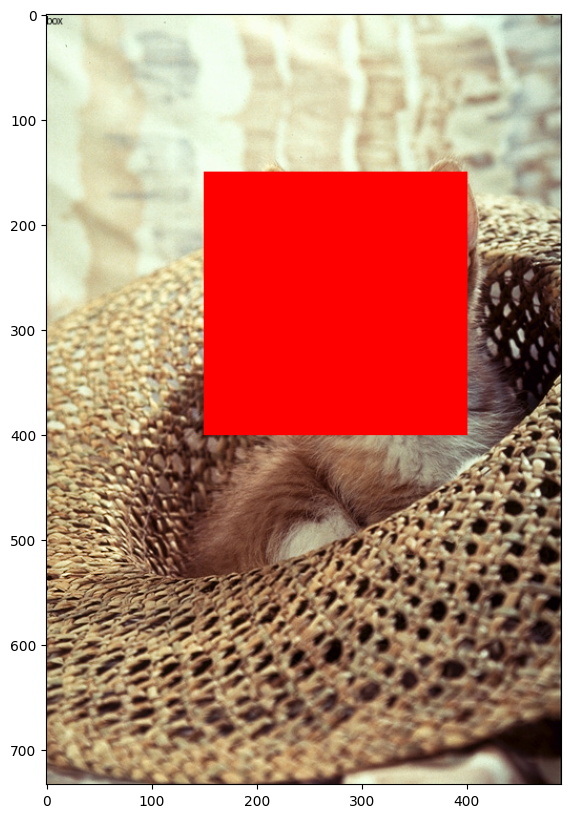

In [40]:
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

We can overlay or paste one image over another by reassigning the pixel for one array to the next. Consider the following image array:


In [ ]:
image_lenna = Image.open("lenna.png") 
# Mở tệp hình ảnh 'lenna.png' bằng thư viện Pillow (PIL.Image) và lưu đối tượng hình ảnh này vào biến 'image_lenna'.

array_lenna = np.array(image_lenna) 
# Chuyển đổi đối tượng hình ảnh 'image_lenna' thành một mảng NumPy nhiều chiều và lưu trữ trong biến 'array_lenna'. 
# Điều này cho phép thực hiện các phép tính toán và thao tác pixel cấp độ mảng bằng NumPy.


We can reassign the pixel values as follows:


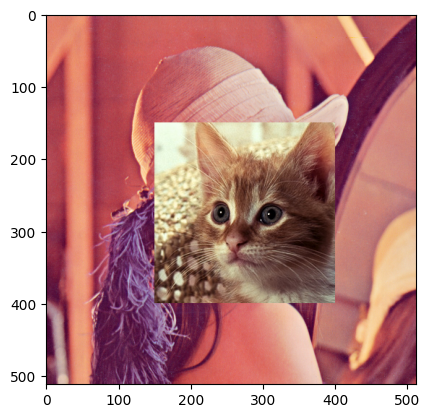

In [ ]:
array_lenna[upper:lower,left:right,:]=array[upper:lower,left:right,:]
# Sao chép một vùng hình chữ nhật cụ thể từ mảng 'array' (ảnh con mèo gốc) 
# sang mảng 'array_lenna' (ảnh Lenna). 
# Vùng được sao chép được xác định bởi các tọa độ [upper:lower] và [left:right] 
# mà bạn đã dùng trước đó. Toàn bộ các kênh màu [:,:] được sao chép.

plt.imshow(array_lenna)
# Hiển thị mảng 'array_lenna' đã được chỉnh sửa (ảnh Lenna với một phần ảnh con mèo được dán lên).

plt.show()


In the same manner, the <code>paste()</code> method allows you to overlay one image over another, with the input being the image you would like to overlay. The parameter box is the left and upper coordinate of the image:


In [ ]:
image_lenna.paste(crop_image, box=(left, upper))
# Sử dụng phương thức .paste() của đối tượng hình ảnh 'image_lenna' (dùng thư viện Pillow).
# - Tham số 'crop_image' là đối tượng hình ảnh đã được cắt và lật trước đó.
# - Tham số 'box=(left, upper)' chỉ định tọa độ góc trên cùng bên trái (X, Y) 
#   nơi mà 'crop_image' sẽ được dán (paste) đè lên trên ảnh 'image_lenna' gốc.


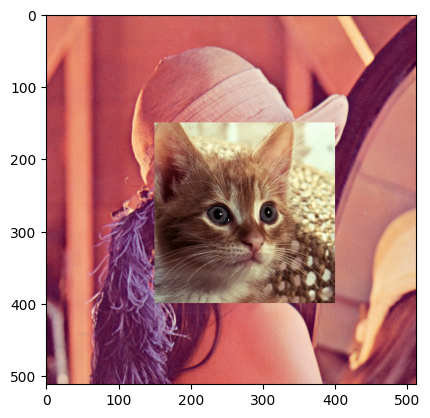

In [44]:
plt.imshow(image_lenna)
plt.show()

We can see the method `copy()` applies to some <code>PIL</code> objects. We create two image objects, we set `new_image` to the `image`, and we use the method `copy()` for the `copy_image` object.


In [ ]:
image = Image.open("cat.png") # Mở tệp hình ảnh 'cat.png' bằng thư viện Pillow và lưu đối tượng ảnh vào biến 'image'.

new_image = image               # Gán biến 'new_image' bằng biến 'image'. 
                                # **Quan trọng:** Cả hai biến này giờ trỏ đến CÙNG MỘT đối tượng trong bộ nhớ. 
                                # Thay đổi 'new_image' cũng sẽ thay đổi 'image'.

copy_image = image.copy()       # Tạo một BẢN SAO ĐỘC LẬP của đối tượng 'image' và lưu vào biến 'copy_image'.
                                # Thay đổi 'copy_image' SẼ KHÔNG ảnh hưởng đến 'image' hoặc 'new_image'.


Like the array, we see that the same memory address relationship exists. For example, if we don't use the method `copy()`, the image object has the same memory address as the original PIL image object. 


In [ ]:
id(image)==id(new_image) id(image) == id(new_image)
# Kiểm tra xem biến 'image' và biến 'new_image' có cùng trỏ đến 
# MỘT đối tượng (object) duy nhất trong bộ nhớ máy tính hay không.


True

If we use the method <code>copy()</code>, the address is different:


In [ ]:
id(image) == id(copy_image)
# Kiểm tra xem biến 'image' (ảnh gốc) và biến 'copy_image' (bản sao) có cùng trỏ đến 
# MỘT đối tượng (object) duy nhất trong bộ nhớ máy tính hay không.


False

If we change the object <code>image</code>, <code>new_image</code> will change, but <code>copy_image</code> will remain the same:


In [ ]:
image_fn = ImageDraw.Draw(im=image)
# Tạo một đối tượng vẽ 'ImageDraw' mới tên là 'image_fn'.
# Đối tượng này liên kết trực tiếp với biến 'image' GỐC.

image_fn.text(xy=(0,0),text="box",fill=(0,0,0))
# Sử dụng công cụ vẽ để thêm chữ "box" màu đen tại góc (0,0) của hình ảnh. 
# **Quan trọng:** Thao tác này CHỈNH SỬA TRỰC TIẾP ảnh gốc đang lưu trong biến 'image'.

image_fn.rectangle(xy=shape,fill="red")
# Sử dụng công cụ vẽ để vẽ và tô đầy một hình chữ nhật màu đỏ lên ảnh.
# **Quan trọng:** Thao tác này cũng CHỈNH SỬA TRỰC TIẾP ảnh gốc đang lưu trong biến 'image'.


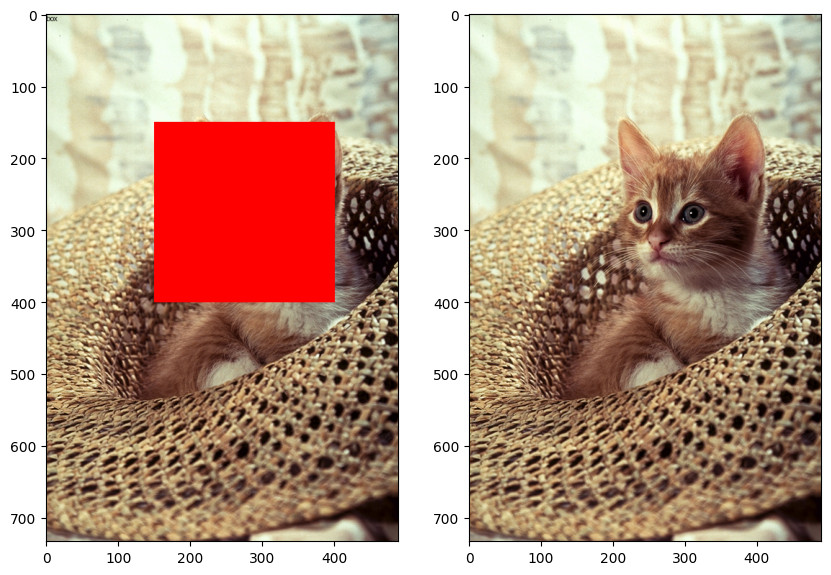

In [ ]:
plt.figure(figsize=(10,10)) # Tạo một vùng vẽ lớn (figure) kích thước 10x10 inch để chứa hai biểu đồ con.

plt.subplot(121)        # Tạo ô biểu đồ con thứ nhất (trái) trong layout 1 hàng, 2 cột.
plt.imshow(new_image)   # Hiển thị ảnh trong biến 'new_image' vào ô bên trái.

plt.subplot(122)        # Tạo ô biểu đồ con thứ hai (phải) trong layout 1 hàng, 2 cột.
plt.imshow(copy_image)  # Hiển thị ảnh trong biến 'copy_image' vào ô bên phải.

plt.show()         


### Question 1:
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `im`, flip `im` and create an image called `im_flip`. Mirror `im` and create an image called `im_mirror`. Finally, plot both images.


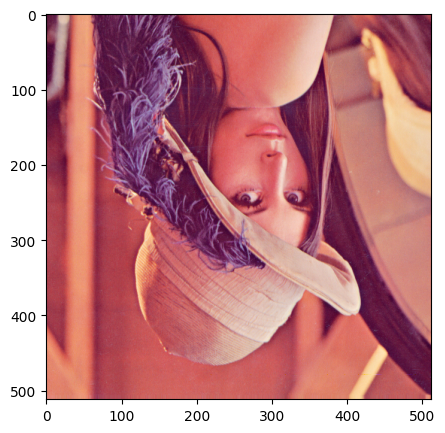

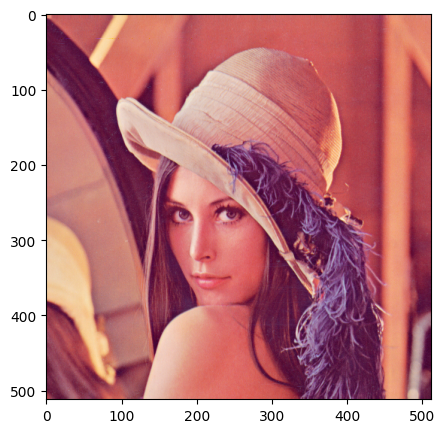

In [60]:
im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

Double-click **here** for a hint.

<!-- The hint is below:

im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->
